# Tutorial 1: Stereo-Seq : MOSTA_E16.5_E1S1 

In [ ]:
# %%

# 使用SpacGPA对 MOATA_E16.5_E1S1 数据进行分析
import numpy as np
import pandas as pd
import random
import time
import torch
import scanpy as sc
import anndata
import os
import gc
import matplotlib.pyplot as plt
import seaborn as sns

from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from PIL import Image

In [ ]:
# %% 切换工作目录

os.getcwd()
workdir = '/dta/ypxu/SpacGPA/Dev_Version/SpacGPA_dev_1'
os.chdir(workdir)
os.getcwd()

'/dta/ypxu/SpacGPA/Dev_Version/SpacGPA_dev_1'

In [ ]:
# %%

import SpacGPA as sg

In [ ]:
# %%

# 读取空转数据
adata = sc.read_h5ad("/dta/ypxu/ST_GGM/VS_Code/ST_GGM_dev_1/data/MOSTA/E16.5_E1S1.MOSTA.h5ad")
adata.var_names_make_unique()
print(adata.X.shape)

adata.X = adata.layers['count']

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.filter_genes(adata, min_cells=10)
print(adata.X.shape)

(121767, 28204)
(121767, 24850)


In [ ]:
# %%

# 使用 GPU 计算GGM，double_precision=False
ggm = sg.create_ggm(adata,
                    project_name = "E16.5_E1S1", 
                    run_mode=2, 
                    double_precision=False,
                    use_chunking=True,
                    chunk_size=10000,
                    stop_threshold=0,
                    FDR_control=True,
                    FDR_threshold=0.01,
                    auto_adjust=True,
                    )  
print(ggm.SigEdges)

Please Normalize The Expression Matrix Before Running!
Loading Data.

Running all calculations on GPU (if available).
Using single precision (float32) for all calculations.
Using chunk size of 10000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 15439 iterations.
Number of genes randomly selected in each iteration: 2000
Iteration: 15439/15439, Updated gene pairs: 18957, Removed gene pairs: 0, Avg loop time: 0.0386 s, Estimated time left: 0.00 min.        
All iterations completed.
Found 35558 significant co-expressed gene pairs with partial correlation >= 0.03

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation mat

In [ ]:
# %%

# 调整Pcor阈值
ggm.adjust_cutoff(pcor_threshold=0.02)

Adjusting Threshold of Pcor and coexpressed cell number...
Ajusted Pcor Thereshold: 0.014 -> 0.02
Found 98778 significant co-expressed gene pairs with partial correlation >= 0.02


In [ ]:
# %%

# 使用改进的mcl聚类识别共表达模块
start_time = time.time()
ggm.find_modules(methods='mcl-hub',
                 expansion=2, inflation=2, max_iter=1000, tol=1e-6, pruning_threshold=1e-5,
                 min_module_size=10, topology_filtering=True, 
                 convert_to_symbols=False, species='mouse')
print(f"Time: {time.time() - start_time:.5f} s")
print(ggm.modules_summary)


Find modules using MCL-Hub...
Current Pcor: 0.02
Total significantly co-expressed gene pairs: 98778
Iteration: 35, Max change: 0.00000000 
Converged at iteration 35.

1 modules were removed due to their linear or radial topology structure out of 107 modules.
Time: 31.16840 s
    module_id  size  num_genes_degree_ge_2  \
0          M1   349                    292   
1          M2   298                    263   
2          M3   293                    246   
3          M4   253                    204   
4          M5   241                    199   
..        ...   ...                    ...   
101      M102    11                      8   
102      M103    10                      5   
103      M104    10                      3   
104      M105    10                      6   
105      M106    10                      6   

                                             all_genes  
0    Neb, Ttn, Gm28653, Mybpc1, Myh8, Myl1, Tnnt3, ...  
1    Krt4, Asprv1, Krt77, Cnfn, Hrnr, Sprr1a, Lor, ...  

In [ ]:
# %%

# GO富集分析
start_time = time.time()
ggm.go_enrichment_analysis(species='mouse',padjust_method="BH",pvalue_cutoff=0.05)
print(f"Time: {time.time() - start_time:.5f} s")
print(ggm.go_enrichment)


Reading GO term information for |mouse|...

Start GO enrichment analysis ...
Found 0 significant enriched GO terms in M106         
GO enrichment analysis completed. Found 19194 significant enriched GO terms total.
Time: 247.37400 s
      module_id  module_size  go_rank       go_id         go_category  \
0            M1          349        1  GO:0030016  cellular_component   
1            M1          349        2  GO:0043292  cellular_component   
2            M1          349        3  GO:0030017  cellular_component   
3            M1          349        4  GO:0003012  biological_process   
4            M1          349        5  GO:0099512  cellular_component   
...         ...          ...      ...         ...                 ...   
19189      M105           10      277  GO:0032731  biological_process   
19190      M105           10      278  GO:0006692  biological_process   
19191      M105           10      279  GO:0006693  biological_process   
19192      M105           10      28

In [ ]:
# %%

# MP富集分析
start_time = time.time()
ggm.mp_enrichment_analysis(species='mouse',padjust_method="BH",pvalue_cutoff=0.05)
print(f"Time: {time.time() - start_time:.5f} s")
print(ggm.mp_enrichment)


Reading MP term information for |mouse|...

Start MP enrichment analysis ...
Found 0 significant enriched MP terms in M106         
MP enrichment analysis completed. Found 13535 significant enriched MP terms total.
Time: 152.24490 s
      module_id  module_size  mp_rank       mp_id  \
0            M1          349        1  MP:0005369   
1            M1          349        2  MP:0004087   
2            M1          349        3  MP:0002108   
3            M1          349        4  MP:0000759   
4            M1          349        5  MP:0002106   
...         ...          ...      ...         ...   
13530      M105           10      153  MP:0008737   
13531      M105           10      154  MP:0011719   
13532      M105           10      155  MP:0005090   
13533      M105           10      156  MP:0002439   
13534      M105           10      157  MP:0000352   

                                                 mp_term  \
0                                       muscle phenotype   
1        

In [ ]:
# %%

# 打印GGM信息
ggm

View of ggm object: E16.5_E1S1
MetaInfo:
  Gene Number: 24850
  Sample Number: 121767
  Pcor Thereshold: 0.02

Results:
  SigEdges: DataFrame with 98778 significant gene pairs
  modules: 106 modules with 6020 genes
  modules_summary: DataFrame with 106 rows
  FDR: Exists

In [ ]:
# %%

# 保存GGM
start_time = time.time()
sg.save_ggm(ggm, "data/MOSTA_E16.5_E1S1.ggm.h5")
print(f"Time: {time.time() - start_time:.5f} s")

Time: 72.28917 s


In [ ]:
# %%

# 读取GGM
start_time = time.time()
ggm = sg.load_ggm("data/MOSTA_E16.5_E1S1.ggm.h5")
print(f"Time: {time.time() - start_time:.5f} s")

Time: 11.46233 s


In [ ]:
# %%

ggm

View of ggm object: E16.5_E1S1
MetaInfo:
  Gene Number: 24850
  Sample Number: 121767
  Pcor Thereshold: 0.02

Results:
  SigEdges: DataFrame with 98778 significant gene pairs
  modules: 106 modules with 6020 genes
  modules_summary: DataFrame with 106 rows
  FDR: Exists

In [ ]:
# %%

# 重新读取数据
del adata
adata = sc.read_h5ad("/dta/ypxu/ST_GGM/VS_Code/ST_GGM_dev_1/data/MOSTA/E16.5_E1S1.MOSTA.h5ad")
adata.var_names_make_unique()
print(adata.X.shape)

adata.X = adata.layers['count']

sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

(121767, 28204)


In [ ]:
# %%

# 计算模块的加权表达值
start_time = time.time()
sg.calculate_module_expression(adata, 
                               ggm, 
                               ggm_key='ggm',
                               top_genes=30,
                               weighted=True,
                               calculate_moran=False,
                               embedding_key='spatial',
                               k_neighbors=6,
                               add_go_anno=5,
                               )
print(f"Time: {time.time() - start_time:.5f} s")
print(adata.uns['module_info'])


Calculating module expression using top 30 genes...

Calculating gene weights based on degree...
Storing module information in adata.uns['module_info']...

Assigning colors to 106 modules...

Total 106 modules' average expression calculated and stored in adata.obs and adata.obsm
Time: 3.17009 s
     module_id     gene  degree  rank    weight top_1_go_term  \
0           M1      Neb     211     1  0.054635     myofibril   
1           M1      Ttn     195     2  0.050492     myofibril   
2           M1  Gm28653     192     3  0.049715                 
3           M1   Mybpc1     179     4  0.046349                 
4           M1     Myh8     147     5  0.038063     myofibril   
...        ...      ...     ...   ...       ...           ...   
2400      M106   Gm9866       2     6  0.066667                 
2401      M106    Mtch2       1     7  0.033333                 
2402      M106   Kcnip3       1     8  0.033333                 
2403      M106   Gm4166       1     9  0.033333      

In [ ]:
# %%

# 删除GGM对象，释放内存
del ggm
gc.collect()

127

In [ ]:
# %%

# 使用leiden聚类和louvain聚类基于模块表达矩阵归一化矩阵进行聚类
start_time = time.time()
sc.pp.neighbors(adata, n_neighbors=18, use_rep='module_expression_scaled',n_pcs=adata.obsm['module_expression_scaled'].shape[1])
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_0.5_ggm')
sc.tl.leiden(adata, resolution=1, key_added='leiden_1_ggm')
sc.tl.louvain(adata, resolution=0.5, key_added='louvan_0.5_ggm')
sc.tl.louvain(adata, resolution=1, key_added='louvan_1_ggm')
print(f"Time: {time.time() - start_time:.5f} s")

/home/ypxu/anaconda3/envs/ST_GGM/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Time: 189.91479 s


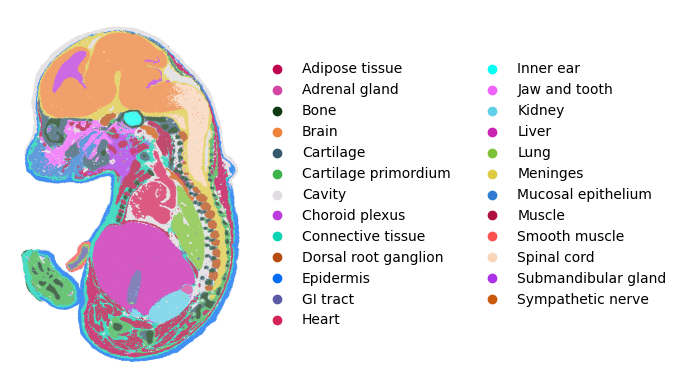

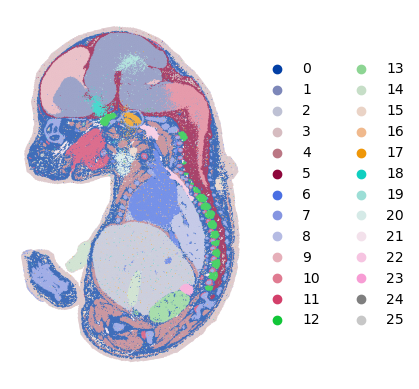

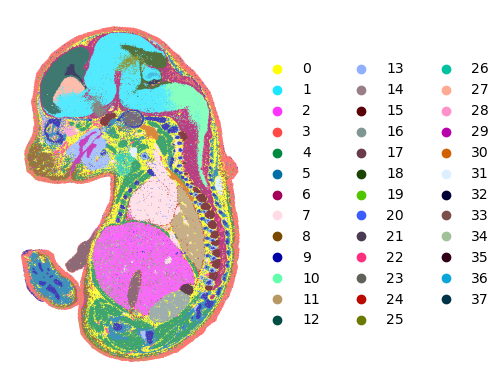

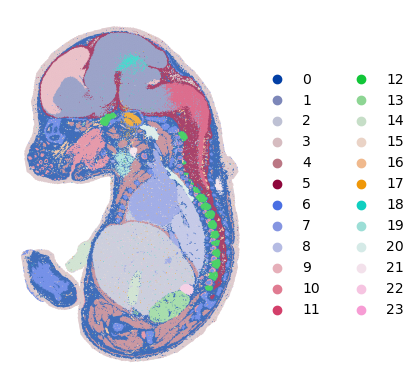

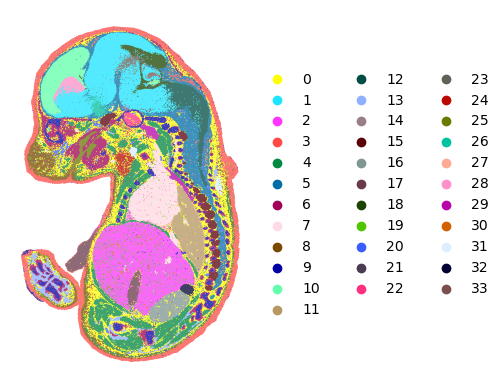

In [ ]:
# %%

# 可视化并保存聚类结果
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="annotation",
                save="/MOSTA_E16_5_E1S1_raw_cell_type_annotation.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="leiden_0.5_ggm", 
              save="/MOSTA_E16_5_E1S1_ggm_modules_leiden_0.5.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="leiden_1_ggm",
                save="/MOSTA_E16_5_E1S1_ggm_modules_leiden_1.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="louvan_0.5_ggm",
                save="/MOSTA_E16_5_E1S1_ggm_modules_louvan_0.5.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="louvan_1_ggm",
                save="/MOSTA_E16_5_E1S1_ggm_modules_louvan_1.pdf",show=True)

In [ ]:
# %%

# 计算GMM注释
start_time = time.time()
sg.calculate_gmm_annotations(adata, 
                            ggm_key='ggm',
                            max_iter=200,
                            prob_threshold=0.99,
                            min_samples=10,
                            n_components=3,
                            enable_fallback=True,
                            embedding_key='spatial',
                            k_neighbors=6,
                            random_state=42)
print(f"Time: {time.time() - start_time:.5f} s")
print(adata.uns['module_stats'])

M1 processed successfully, annotated cells: 9996
M2 processed successfully, annotated cells: 5862
M3 processed successfully, annotated cells: 14425
M4 processed successfully, annotated cells: 14874
M5 processed successfully, annotated cells: 4279
M6 processed successfully, annotated cells: 1069
M7 processed successfully, annotated cells: 491
M8 processed successfully, annotated cells: 46580
M9 processed successfully, annotated cells: 3386
M10 processed successfully, annotated cells: 2465
M11 processed successfully, annotated cells: 2706
M12 processed successfully, annotated cells: 2692
M13 processed successfully, annotated cells: 13396
M14 processed successfully, annotated cells: 15860
M15 processed successfully, annotated cells: 2703
M16 processed successfully, annotated cells: 2732
M17 processed successfully, annotated cells: 3242
M18 processed successfully, annotated cells: 1761
M19 processed successfully, annotated cells: 8155
M20 processed successfully, annotated cells: 8528
M21 p

In [ ]:
# %%

adata.uns['module_stats'].to_csv("data/MOSTA_E16.5_E1S1_ggm_module_stats.csv")

In [ ]:
# %%

# 平滑注释
start_time = time.time()
sg.smooth_annotations(adata, 
                      ggm_key='ggm',
                      embedding_key='spatial',
                      k_neighbors=24,
                      min_drop_neighbors=1,
                      min_add_neighbors='half',
                      max_weight_ratio=1.5,
                      border_iqr_factor=1.5,
                      )
print(f"Time: {time.time() - start_time:.5f} s")    

M1 processed. remain cells: 11231
M2 processed. remain cells: 6990
M3 processed. remain cells: 14796
M4 processed. remain cells: 16417
M5 processed. remain cells: 4887
M6 processed. remain cells: 1241
M7 processed. remain cells: 485
M8 processed. remain cells: 54222
M9 processed. remain cells: 3725
M10 processed. remain cells: 2552
M11 processed. remain cells: 2259
M12 processed. remain cells: 2970
M13 processed. remain cells: 14765
M14 processed. remain cells: 18146
M15 processed. remain cells: 2984
M16 processed. remain cells: 2995
M17 processed. remain cells: 3285
M18 processed. remain cells: 2285
M19 processed. remain cells: 8074
M20 processed. remain cells: 10130
M21 processed. remain cells: 4159
M22 processed. remain cells: 1099
M23 processed. remain cells: 407
M24 processed. remain cells: 447
M25 processed. remain cells: 3399
M26 processed. remain cells: 2000
M27 processed. remain cells: 3292
M28 processed. remain cells: 333
M29 processed. remain cells: 25156
M30 processed. rema

In [ ]:
# %%

# 分析模块类型
start_time = time.time()
sg.classify_modules(adata, 
                    ggm_key='ggm',
                    ref_anno='annotation',
                    #ref_cluster_method='leiden',
                    #ref_resolution=0.5,
                    skew_threshold=2,
                    top1pct_threshold=2,
                    Moran_I_threshold=0.1,
                    min_dominant_cluster_fraction=0.2,
                    anno_overlap_threshold=0.4)

In [ ]:
# %%

adata.uns['module_filtering']['type_tag'].value_counts()

type_tag
cell_identity_module        69
cellular_activity_module    16
mixed_regional_module        9
diffuse_module               8
redundant_module             4
Name: count, dtype: int64

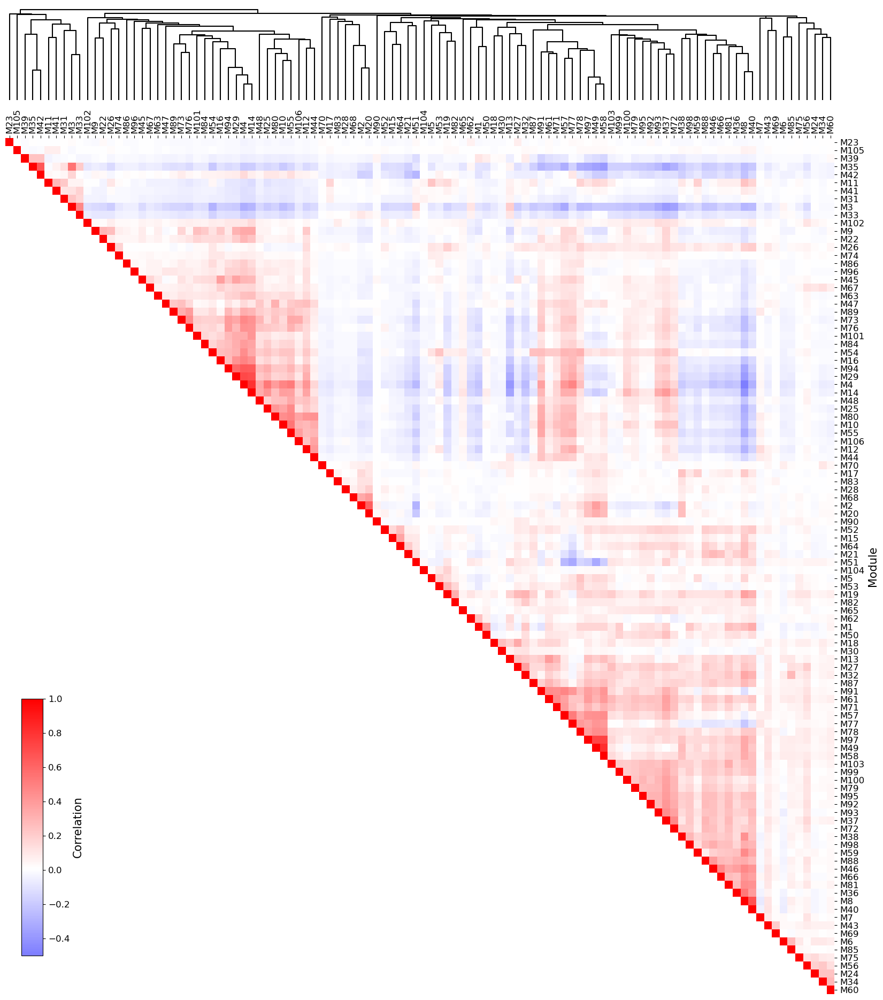

In [ ]:
# %%

# 计算并可视化模块之间的相似性
mod_cor = sg.calculating_module_similarity(adata,
                                ggm_key='ggm',
                                use_smooth=True,
                                corr_method='pearson',
                                linkage_method='average',
                                return_summary=True,
                                plot_heatmap=True,
                                heatmap_metric='correlation',   
                                fig_height=24,
                                fig_width=20,
                                dendrogram_height=0.1,
                                dendrogram_hspace=0.08,
                                axis_fontsize=12,
                                axis_labelsize=15,
                                legend_fontsize=12,
                                legend_labelsize=15,
                                cmap_name='bwr',
                                save_plot_as="figures/MOSTA_E16.5_E1S1_module_corr_similarity.pdf",  
                                )

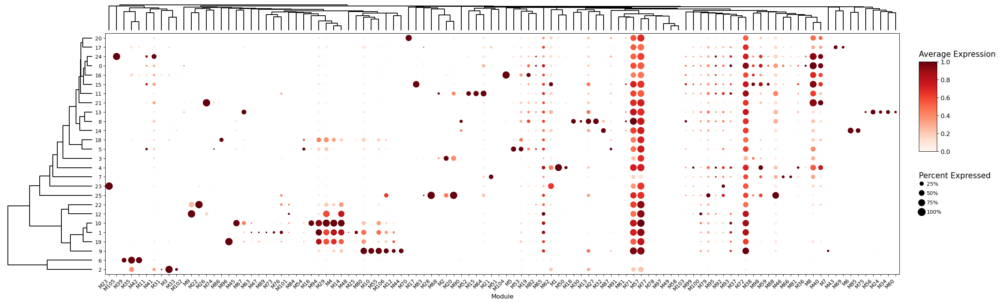

In [ ]:
# %%

# 可视化模块在各个leiden分群里的表达气泡图
sg.module_dot_plot(
    adata,
    ggm_key='ggm',
    groupby= 'leiden_0.5_ggm', 
    scale = True,
    corr_method='pearson',
    linkage_method='average',
    show_dendrogram = True,
    dendrogram_height = 0.1,
    fig_height = 8,
    fig_width = 24,
    dot_max_size=200,
    cmap='Reds',
    axis_labelsize=12,
    axis_fontsize=10,
    return_df=False,
    save_plot_as="figures/MOSTA_E16.5_E1S1_leiden_0_5_ggm_module_dotplot.pdf",
)

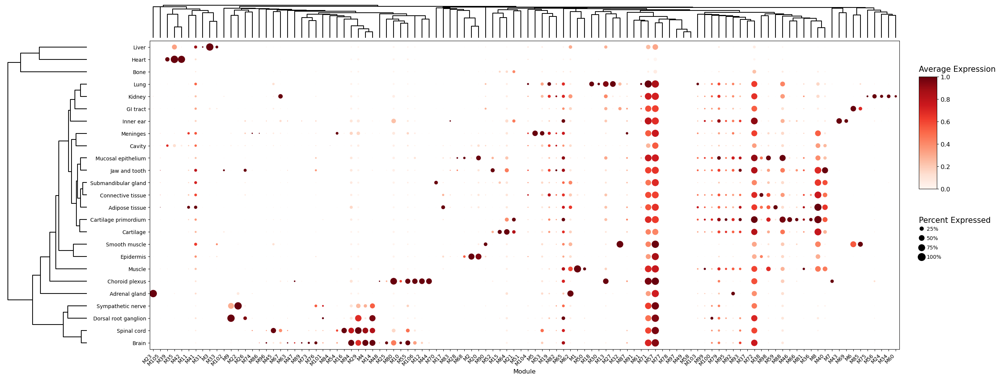

In [ ]:
# %%

# 可视化模块在各个原始注释分群里的表达气泡图
sg.module_dot_plot(
    adata,
    ggm_key='ggm',
    groupby= 'annotation', 
    scale = True,
    corr_method='pearson',
    linkage_method='average',
    show_dendrogram = True,
    dendrogram_height = 0.1,
    fig_height = 10,
    fig_width = 24,
    dot_max_size=200,
    cmap='Reds',
    axis_labelsize=12,
    axis_fontsize=10,
    return_df=False,
    save_plot_as="figures/MOSTA_E16.5_E1S1_raw_cell_type_module_dotplot.pdf",
)

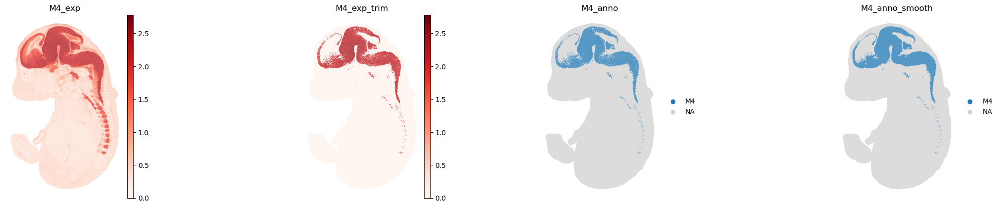

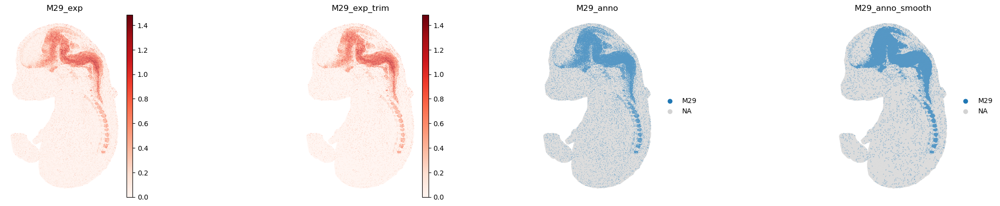

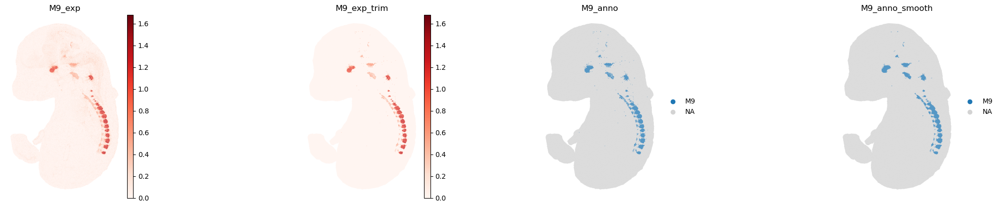

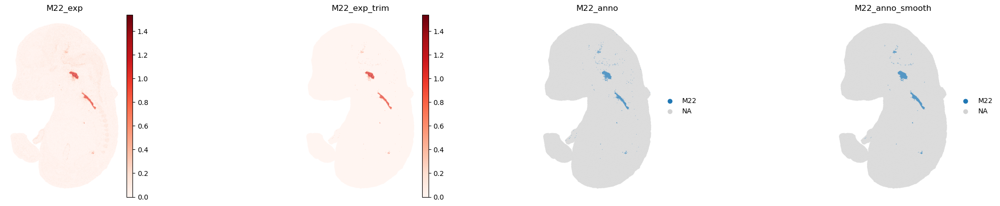

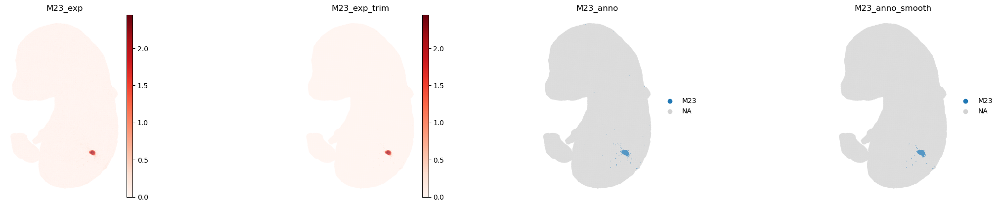

...

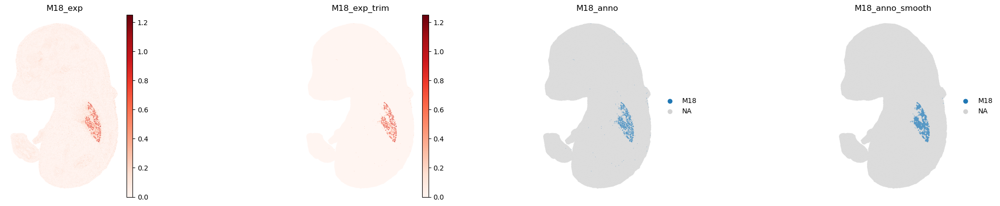

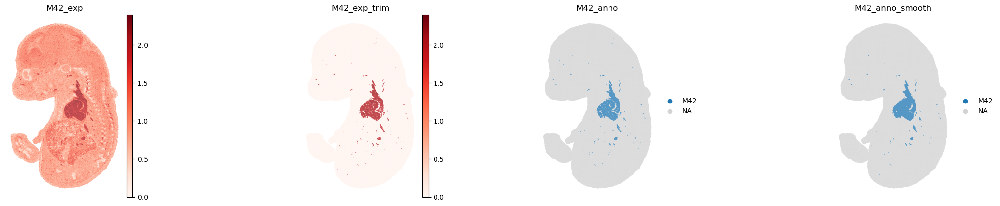

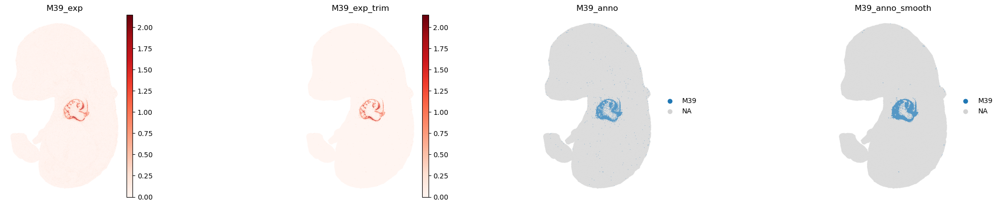

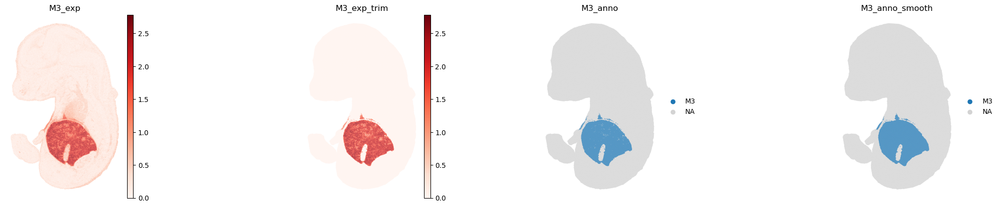

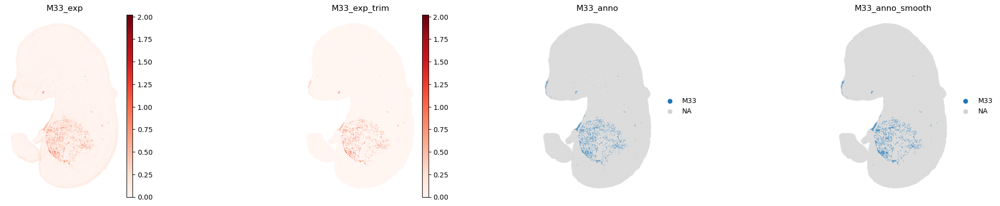

In [ ]:
# %%

# 展示部分模块的注释结果
module_show = ['M4', 'M29', 'M9', 'M22', 'M23', 'M44', 'M1', 'M2', 
               'M32', 'M64', 'M21', 'M17', 'M70', 'M52', 'M43', 'M6','M67','M56','M34',
               'M27', 'M18', 'M42', 'M39', 'M3', 'M33']
for module in module_show:
    sc.pl.spatial(adata, spot_size=1.2, frameon = False, color_map="Reds", 
                  color=[f"{module}_exp", f"{module}_exp_trim", 
                         f"{module}_anno", f"{module}_anno_smooth"],show=True)

In [ ]:
# %%

module_used = adata.uns['module_filtering'][adata.uns['module_filtering']['type_tag']=='cell_identity_module']['module_id'].tolist()

In [ ]:
# %%

# 合并注释（考虑空间坐标和模块表达值）
# 1. 使用全部模块
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        result_anno='ggm_annotation',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0.9,
                        )
# 2. 使用经过鉴别的模块
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        modules_used=adata.uns['module_filtering'][adata.uns['module_filtering']['is_identity']== True]['module_id'],
                        result_anno='ggm_annotation_filtered',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0.9,
                        )
# 3. 不使用activity模块
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        modules_excluded=adata.uns['module_filtering'][adata.uns['module_filtering']['type_tag']=='cellular_activity_module']['module_id'],
                        result_anno='ggm_annotation_no_activity',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0.9,
                        )


Calculating 24 nearest neighbors for each cell based on spatial embedding...


118696 of total 121767 cells have multiple annotations. Among them, 
    14301 cells are resolved by neighbors.
    104395 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].


Calculating 24 nearest neighbors for each cell based on spatial embedding...


67105 of total 121767 cells have multiple annotations. Among them, 
    21749 cells are resolved by neighbors.
    45356 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation_filtered'].


Calculating 24 nearest neighbors for each cell based on spatial embedding...


118696 of total 121767 cells have multiple annotations. Among them, 
    14301 cells are resolved by neighbors.
    104395 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation_no_activity'].



In [ ]:
# %%

# 合并注释（不考虑空间坐标）
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        result_anno='ggm_annotation_no_spatial',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0,
                        )
# 2. 使用经过鉴别的模块
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        modules_used=adata.uns['module_filtering'][adata.uns['module_filtering']['is_identity']== True]['module_id'],
                        result_anno='ggm_annotation_filtered_no_spatial',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0,
                        )
# 3. 不使用activity模块
sg.integrate_annotations_noweight(adata,
                        ggm_key='ggm',
                        modules_excluded=adata.uns['module_filtering'][adata.uns['module_filtering']['type_tag']=='cellular_activity_module']['module_id'],
                        result_anno='ggm_annotation_no_activity_no_spatial',
                        use_smooth=True,
                        embedding_key='spatial',
                        k_neighbors=24,
                        neighbor_similarity_ratio=0,
                        )

When set to 0, the neighbor_similarity_ratio will not be used.

Calculating 24 nearest neighbors for each cell based on spatial embedding...


118696 of total 121767 cells have multiple annotations. Among them, 
    0 cells are resolved by neighbors.
    118696 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation_no_spatial'].

When set to 0, the neighbor_similarity_ratio will not be used.

Calculating 24 nearest neighbors for each cell based on spatial embedding...


67105 of total 121767 cells have multiple annotations. Among them, 
    0 cells are resolved by neighbors.
    67105 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation_filtered_no_spatial'].

When set to 0, the neighbor_similarity_ratio will not be used.

Calculating 24 nearest neighbors for each cell based on spatial embedding...


118696 of total 121767 cells have multiple annotations. Among them, 
    0 cells are resolved by n

In [ ]:
# %%

# 保存注释结果
adata.obs.to_csv("data/MOSTA_E16.5_E1S1_ggm_annotation.csv")

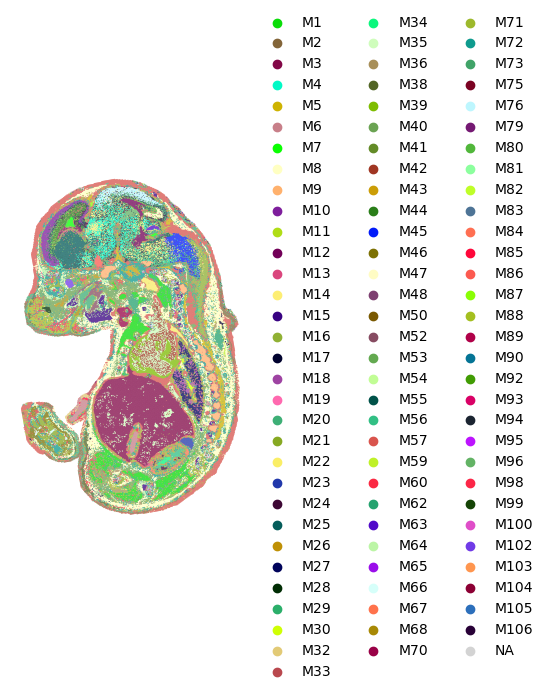

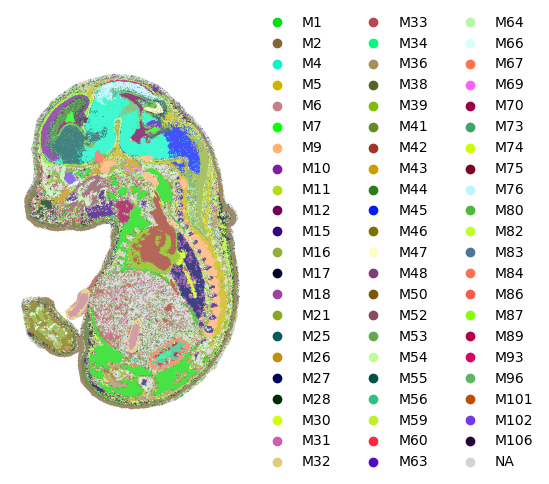

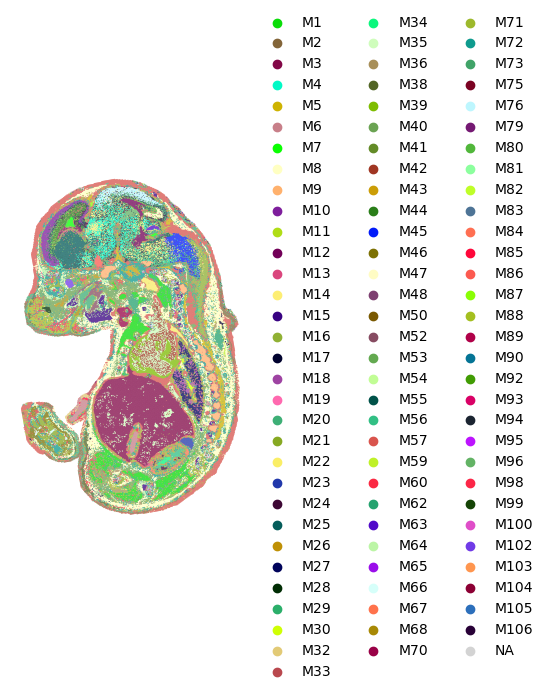

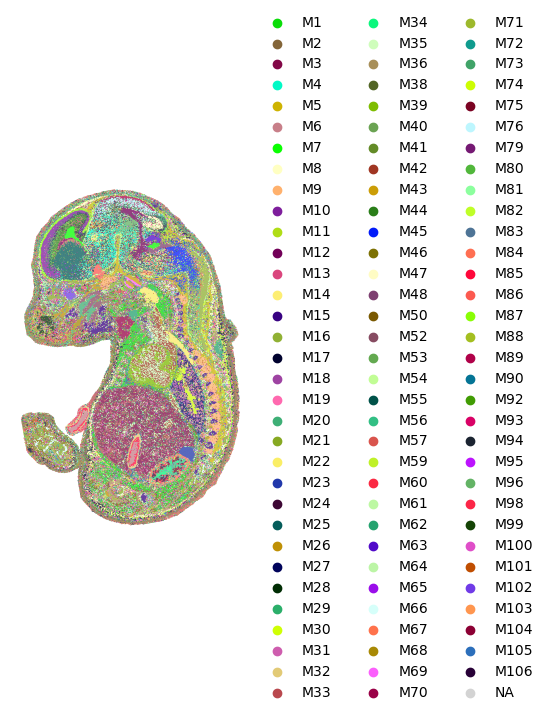

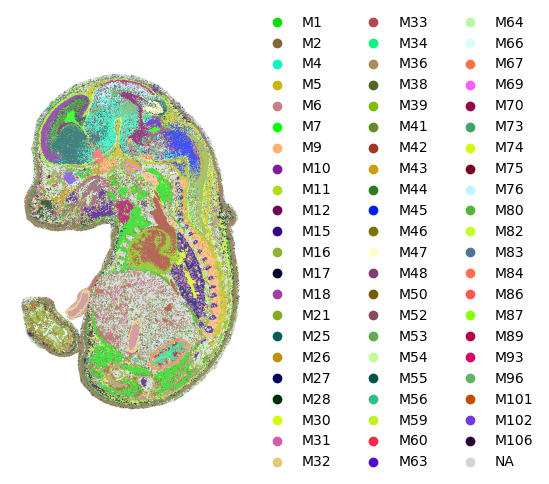

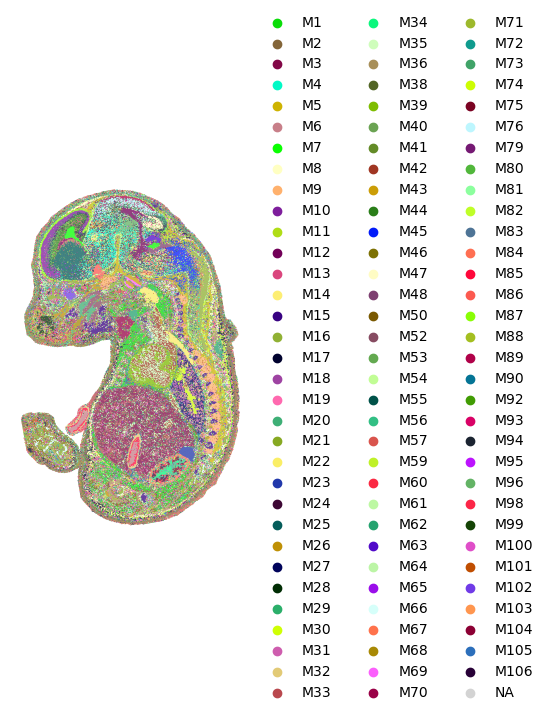

In [ ]:
# %%

# 注释结果可视化并保存可视化结果
sg.assign_module_colors(adata,ggm_key='ggm',seed=5)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation", palette=adata.uns['module_colors'],
              save="/MOSTA_E16_5_E1S1_All_modules_annotation.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation_filtered", palette=adata.uns['module_colors'],
                save="/MOSTA_E16_5_E1S1_Filtered_modules_annotation.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation_no_activity", palette=adata.uns['module_colors'],
                save="/MOSTA_E16_5_E1S1_No_activity_modules_annotation.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation_no_spatial", palette=adata.uns['module_colors'],
                save="/MOSTA_E16_5_E1S1_All_modules_annotation_no_spatial.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation_filtered_no_spatial", palette=adata.uns['module_colors'],
                save="/MOSTA_E16_5_E1S1_Filtered_modules_annotation_no_spatial.pdf",show=True)
sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="ggm_annotation_no_activity_no_spatial", palette=adata.uns['module_colors'],
                save="/MOSTA_E16_5_E1S1_No_activity_modules_annotation_no_spatial.pdf",show=True)

In [ ]:
# %%

# 保存adata
adata.write("data/MOSTA_E16.5_E1S1_ggm_anno.h5ad")

In [ ]:
# %%

# 测试新版整合函数
start_time = time.time()
sg.integrate_annotations(
    adata,
    ggm_key='ggm',
    modules_used=module_used,
    result_anno='annotation_new_id',
    k_neighbors=24,
    lambda_pair=0.3,
    purity_adjustment=False,
    w_floor=0.01,
    lr=0.5,
    target_purity=0.85,
    # alpha=0.5,
    # beta=0.3
    gamma=0.3,
    # delta=0.4,   
    max_iter=100,
    random_state=0)
print(f"Time: {time.time() - start_time:.5f} s")

Main parameters for integration:
  alpha = 0.40  for neighbor-vote weight
  beta  = 0.30  for expression-rank weight
  gamma = 0.30  for spatial-density weight
  delta = 0.40  for low-purity penalty weight
  lambda_pair = 0.30  for potts smoothing strength

Starting optimization...
Iteration:   0, Energy: 428412.12
Iteration:  47, Energy: 406424.31, ΔE: -165.89, Changed: 47        
Converged

Time: 2351.27463 s


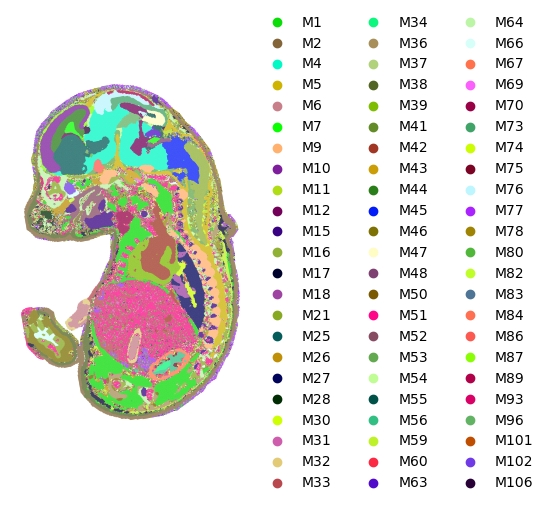

In [ ]:
# %%

sc.pl.spatial(adata, spot_size=1.2, title= "", frameon = False, color="annotation_new_id", show=True, palette=adata.uns['module_colors'],
              save="/MOSTA_E16_5_E1S1_ggm_modules_annotation_new_id.pdf")